In [1]:
import pandas as pd
import numpy as np
import os
import json
import matplotlib.pyplot as plt
import matplotlib as mpl
from sklearn.manifold import TSNE
# Default settings
mpl.rcParams.update(mpl.rcParamsDefault)
plt.style.use("seaborn-darkgrid")

C:\Users\dicky1031\AppData\Local\Temp\ipykernel_32296\273221587.py:10: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn-darkgrid")


In [2]:
def plot_formula3_delta_OD(dataset, wavelength, subject, used_idx, result_folder):
    data = dataset.iloc[used_idx]
    now_ijv_SO2 = round(data['true'])
    fig, ax = plt.subplots(5,4,figsize=(16,12))
    fig.suptitle(r'$\Delta$OD spectrum @ $\Delta$SO2 :' + f'{now_ijv_SO2:.1f}%', fontsize=20)
    for i in range(20):
        ijv_large_spec = []
        ijv_small_spec = []
        for j in range(20):
            ijv_large_spec.append(data[f'data_value_{j+i*20}'])
            ijv_small_spec.append(data[f'data_value_{400+j+i*20}'])
        ijv_large_spec = np.array(ijv_large_spec)
        # if (ijv_large_spec.max() - ijv_large_spec.min()) != 0:
        #     ijv_large_spec = (ijv_large_spec - ijv_large_spec.min())/ (ijv_large_spec.max() - ijv_large_spec.min())
        
        ijv_small_spec = np.array(ijv_small_spec)
        # if (ijv_small_spec.max() - ijv_small_spec.min()) != 0:
        #     ijv_small_spec = (ijv_small_spec - ijv_small_spec.min())/ (ijv_small_spec.max() - ijv_small_spec.min())
        
        ax[i//4][i%4].plot(wavelength, ijv_large_spec, label=r'$IJV_{large}$')
        ax[i//4][i%4].plot(wavelength, ijv_small_spec, label=r'$IJV_{small}$')
        ax[i//4][i%4].set_xlabel("wavelength(nm)")
        ax[i//4][i%4].set_ylabel(f"$\Delta$OD")
        ax[i//4][i%4].title.set_text(f'based on {wavelength[i]} nm')
        ax[i//4][i%4].legend()
    fig.tight_layout()
    fig.savefig(os.path.join("pic", subject, result_folder, "delta_OD", f"{now_ijv_SO2}_delta_OD.png"), dpi=300, format='png', bbox_inches='tight')
    plt.show()

In [3]:
def plot_formula2_delta_OD(dataset, wavelength, subject, used_idx, result_folder):
    data = dataset.iloc[used_idx]
    now_ijv_SO2 = round(data['true'])
    # fig, ax = plt.subplots(5,4,figsize=(16,12))
    # fig.suptitle(r'$\Delta$OD spectrum @ $\Delta$SO2 :' + f'{now_ijv_SO2:.1f}%', fontsize=20)
    ijv_large_spec = []
    ijv_small_spec = []
    for i in range(20):
        ijv_large_spec.append(data[f'data_value_{i}'])
        ijv_small_spec.append(data[f'data_value_{20 + i}'])
    plt.plot(wavelength, ijv_large_spec, label=r'$IJV_{large}$')
    plt.plot(wavelength, ijv_small_spec, label=r'$IJV_{small}$')
    plt.xlabel("wavelength(nm)")
    plt.ylabel(f"$\Delta$OD")
    plt.title(r'$\Delta$OD spectrum @ $\Delta$SO2 :' + f'{now_ijv_SO2:.1f}%')
    plt.legend(loc='center left', bbox_to_anchor=(1.05, 0.5),
                            fancybox=True, shadow=True)
    plt.tight_layout()
    plt.savefig(os.path.join("pic", subject, result_folder, "delta_OD", f"{now_ijv_SO2}_delta_OD.png"), dpi=300, format='png', bbox_inches='tight')
    plt.show()

In [4]:
def plot_2D_tsne(dataset, num_input, get_portion, perplexity):
    # get dataset and label
    dataset = dataset.sort_values('true')
    use_col = []
    for i in range(num_input):
        use_col += [f'data_value_{i}']
    spec_data = dataset[use_col].to_numpy()
    label = dataset['true'].to_numpy()

    get_portion = get_portion
    used_index = []
    for SO2_idx in range(51):
        used_index += [i for i in range(SO2_idx*4000,SO2_idx*4000+get_portion)]
    spec_data = spec_data[used_index]
    label = np.round(label[used_index],2)
    
    # TSNE
    X_embedded = TSNE(n_components=2, perplexity=perplexity, n_iter=5000).fit_transform(spec_data)
    
    # plot
    plot_data = X_embedded
    x_min, x_max = np.min(plot_data, axis=0), np.max(plot_data, axis=0)
    plot_data = (plot_data-x_min) / (x_max - x_min)
    fig = plt.figure()
    for i in range(plot_data.shape[0]):
        color = (label[i]+30)/50
        if i% get_portion == 0:
            plt.scatter(plot_data[i,0], plot_data[i,1], s=5, color=plt.colormaps['rainbow'](color), label=f'{label[i]:2.0f}%')
        else:
            plt.scatter(plot_data[i,0], plot_data[i,1], s=5, color=plt.colormaps['rainbow'](color))
        # plt.text(plot_data[i,0], plot_data[i,1], str(label[i]), color=plt.cm.Set1(label[i]), fontdict={'weight': 'bold', 'size' : 9})
    plt.title("TSNE")
    plt.legend(loc='center left', bbox_to_anchor=(1.05, 0.5),
                            fancybox=True, shadow=True, ncol=3)
    plt.xticks([])
    plt.yticks([])
    
    return fig

def plot_3D_tsne(dataset, num_input, get_portion, perplexity):
    # get dataset and label
    dataset = dataset.sort_values('true')
    use_col = []
    for i in range(num_input):
        use_col += [f'data_value_{i}']
    spec_data = dataset[use_col].to_numpy()
    label = dataset['true'].to_numpy()

    get_portion = get_portion
    used_index = []
    for SO2_idx in range(51):
        used_index += [i for i in range(SO2_idx*4000,SO2_idx*4000+get_portion)]
    spec_data = spec_data[used_index]
    label = np.round(label[used_index],2)
    
    # TSNE
    X_embedded = TSNE(n_components=3, perplexity=perplexity, n_iter=5000).fit_transform(spec_data)
    
    # plot
    plot_data = X_embedded
    x_min, x_max = np.min(plot_data, axis=0), np.max(plot_data, axis=0)
    plot_data = (plot_data-x_min) / (x_max - x_min)

    fig = plt.figure()
    ax = fig.add_subplot(projection='3d')
    for i in range(plot_data.shape[0]):
        color = (label[i]+30)/50
        if i% get_portion == 0:
            ax.scatter(plot_data[i,0], plot_data[i,1], plot_data[i,2], s=5, color=plt.colormaps['rainbow'](color), label=f'{label[i]:2.0f}%')
        else:
            ax.scatter(plot_data[i,0], plot_data[i,1], plot_data[i,2], s=5, color=plt.colormaps['rainbow'](color))
        # plt.text(plot_data[i,0], plot_data[i,1], str(label[i]), color=plt.cm.Set1(label[i]), fontdict={'weight': 'bold', 'size' : 9})
    plt.title("TSNE")
    plt.legend(loc='center left', bbox_to_anchor=(1.05, 0.5),
                            fancybox=True, shadow=True, ncol=3)
    plt.xticks([])
    plt.yticks([])
    ax.set_zticks([])
    
    return fig
    

In [9]:
a = np.array([[0,1],[2,3]])
b = []
b += a.tolist()
b

[[0, 1], [2, 3]]

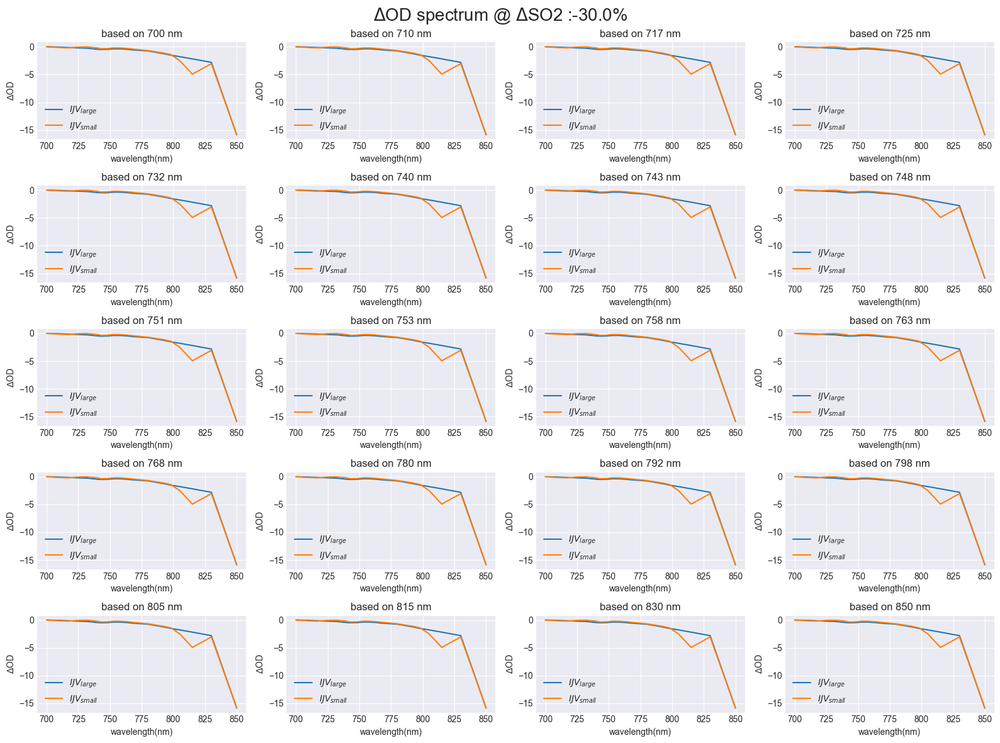

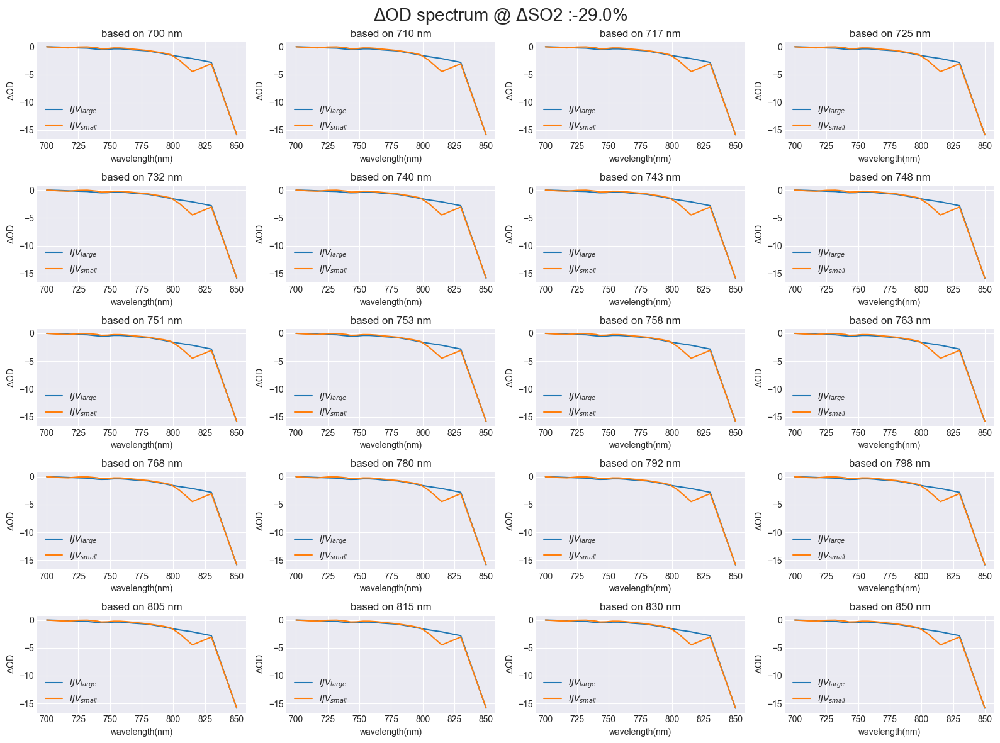

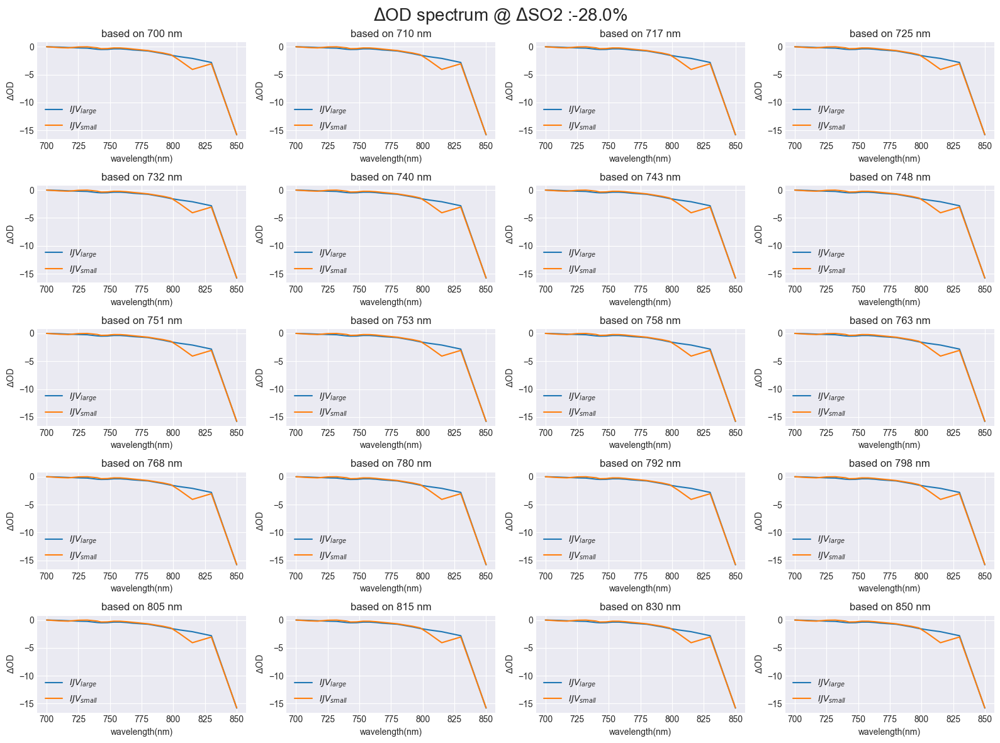

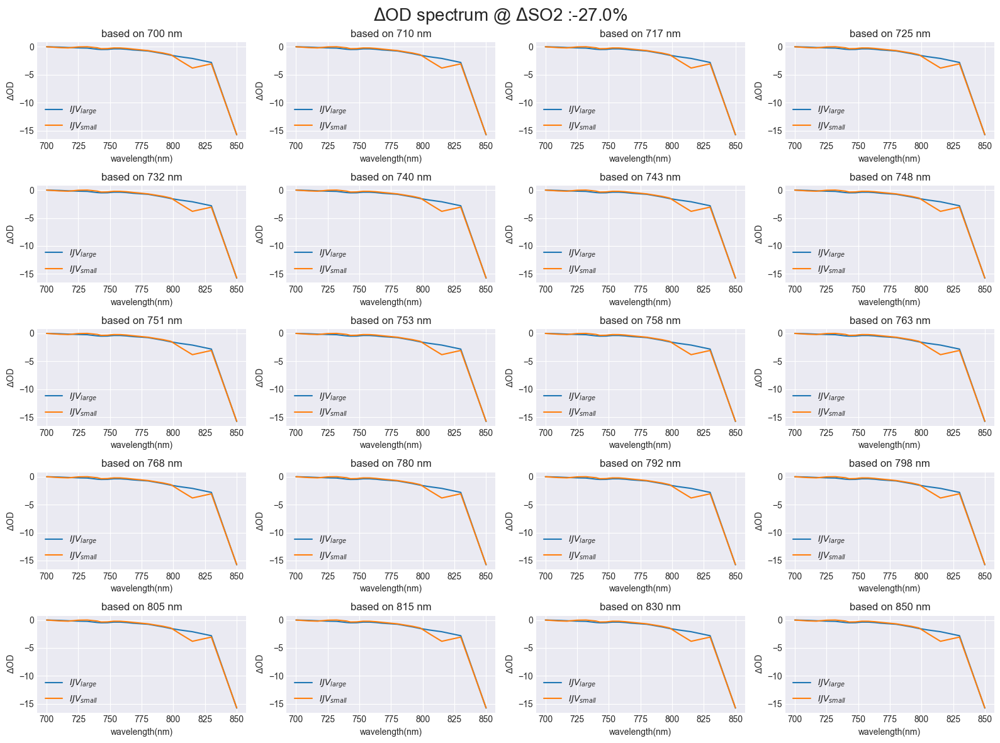

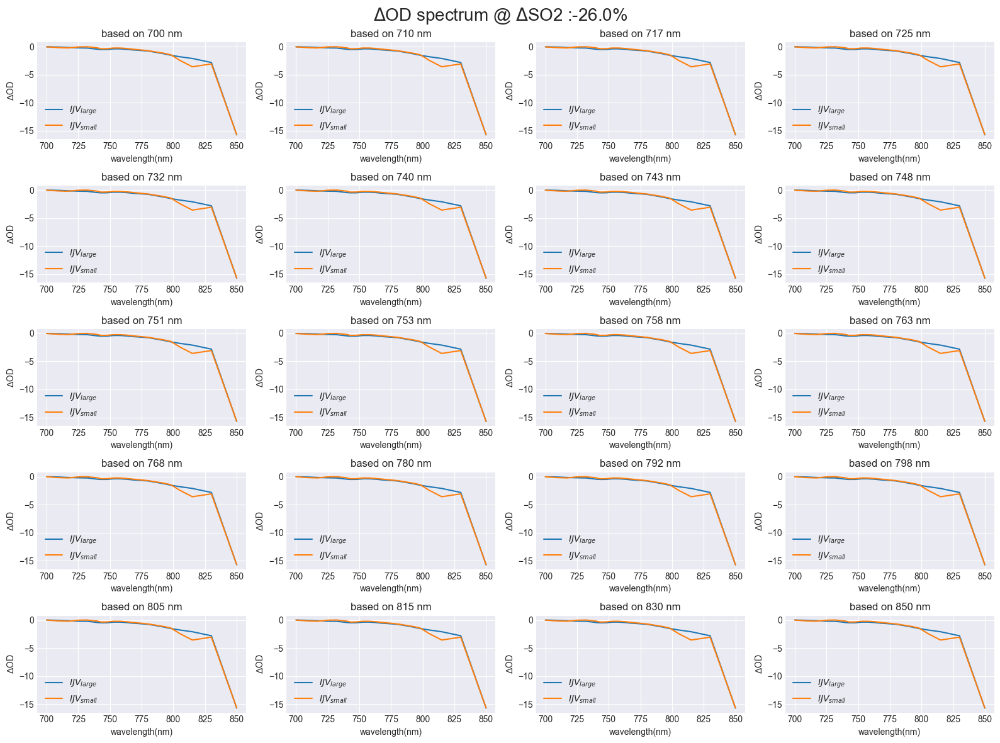

...

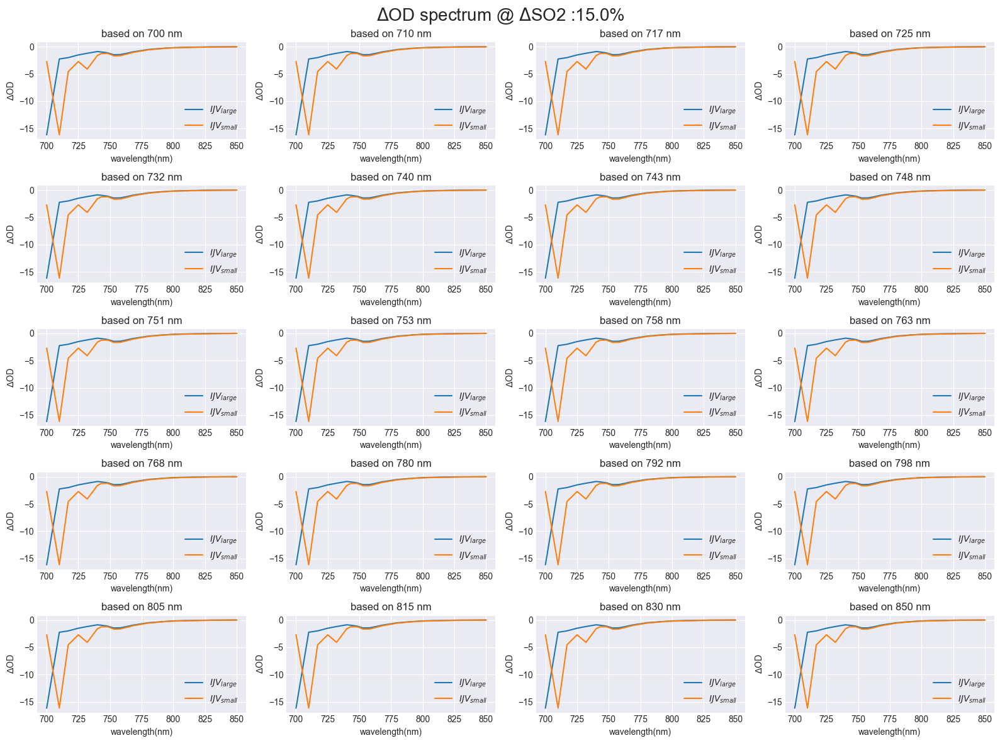

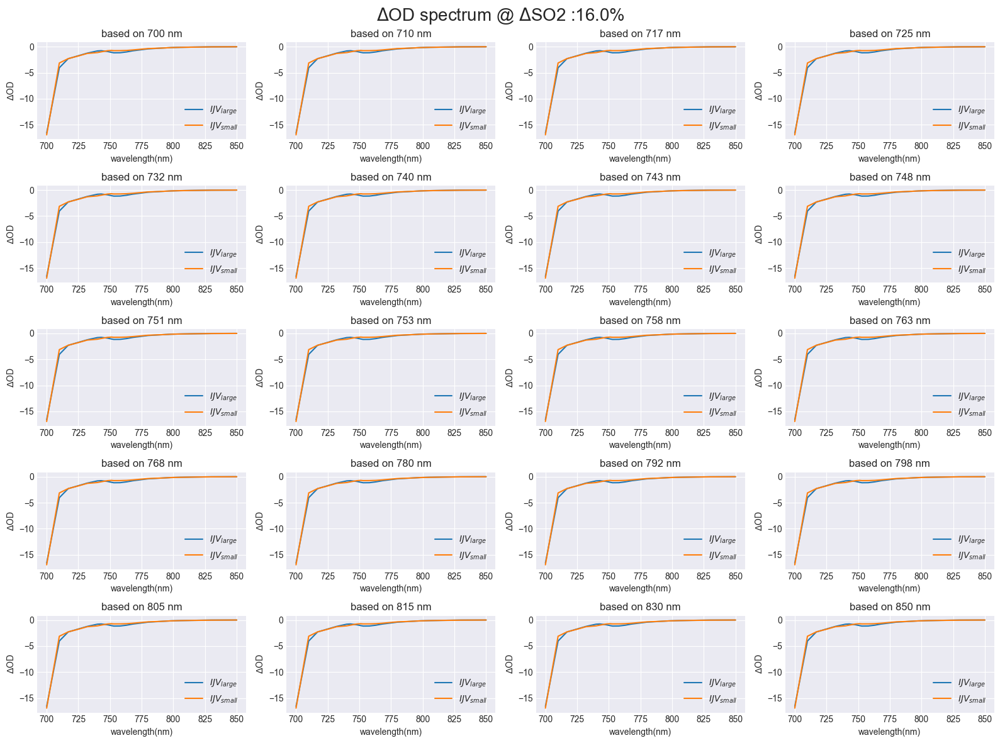

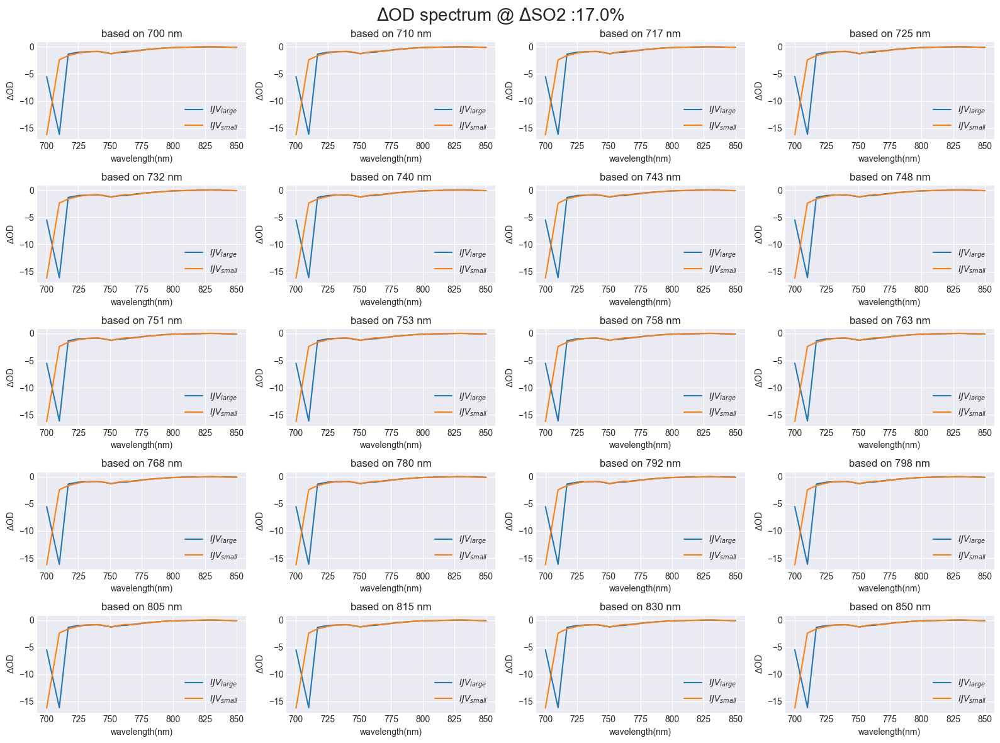

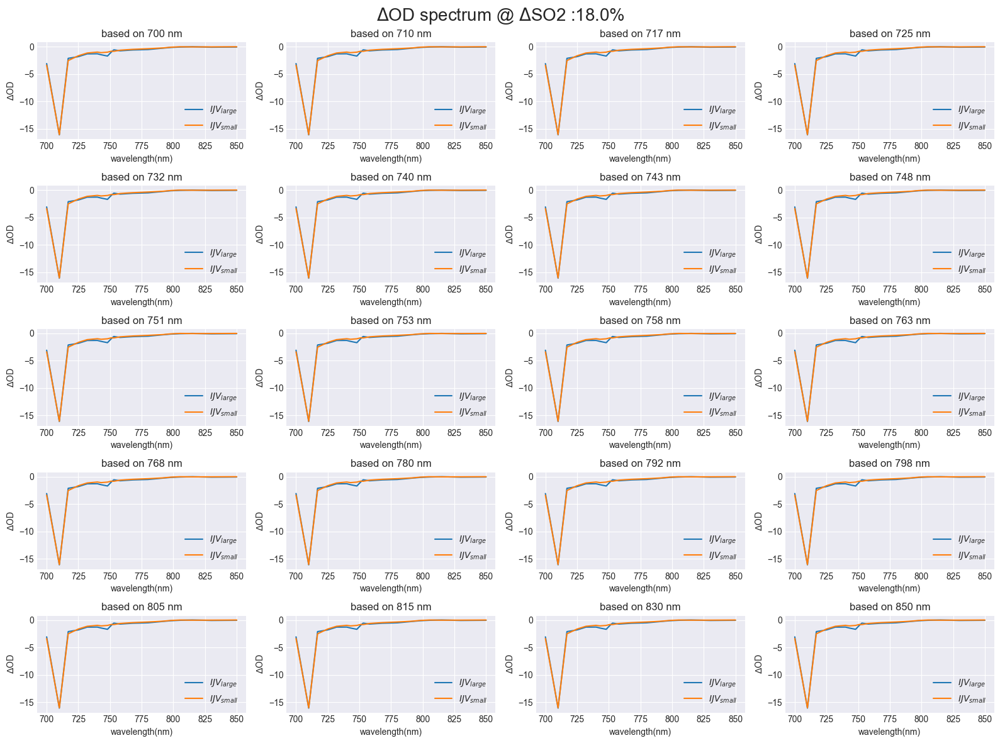

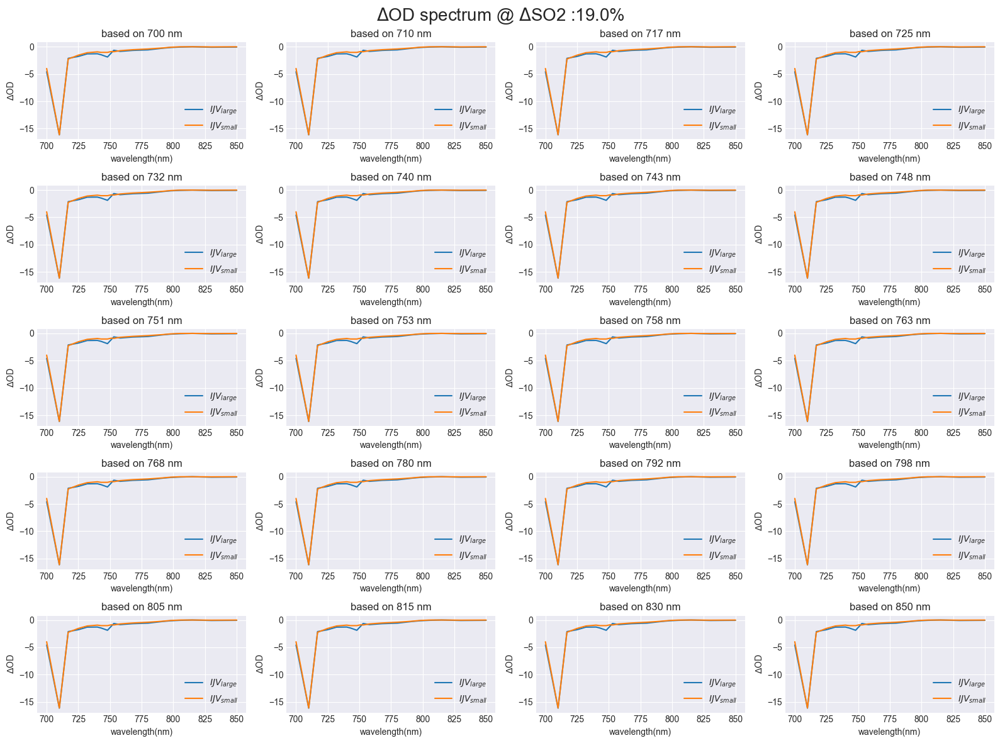

In [5]:

subject = "ctchen"
result_folder = "prediction_model_formula24"

os.makedirs(os.path.join("pic", subject, result_folder, "delta_OD"), exist_ok=True)
os.makedirs(os.path.join("pic", subject, result_folder, "tsne_2d"), exist_ok=True)
os.makedirs(os.path.join("pic", subject, result_folder, "tsne_3d"), exist_ok=True)
file_path = os.path.join("dataset", result_folder, "RMSE.csv")
dataset_formula3 = pd.read_csv(file_path)
with open(os.path.join("OPs_used", "wavelength.json"), 'r') as f:
    wavelength = json.load(f)
    wavelength = wavelength['wavelength']

for find_SO2 in range(-30,20):
# for find_SO2 in [-30,20]:
    used_idx = np.where(abs(dataset_formula3['true'].to_numpy()-find_SO2) < 0.01)[0][5]
    plot_formula3_delta_OD(dataset=dataset_formula3, wavelength=wavelength, subject=subject, used_idx=used_idx, result_folder=result_folder)
# plot_formula3_delta_OD(dataset=dataset_formula3, wavelength=wavelength, subject=subject, used_idx=988, result_folder=result_folder)
# plot_formula3_delta_OD(dataset=dataset_formula3, wavelength=wavelength, subject=subject, used_idx=0, result_folder=result_folder)

# plot_formula3_delta_OD(dataset=dataset_formula3, wavelength=wavelength, subject=subject, used_idx=494, result_folder=result_folder)


# for perplexity in [2,5,30,50,100]:
#     fig = plot_2D_tsne(dataset=dataset_formula3, num_input=800, get_portion=100, perplexity=perplexity)
#     plt.savefig(os.path.join("pic", subject, result_folder, "tsne_2d", f"p_{perplexity}_tsne_2d.png"), dpi=300, format='png', bbox_inches='tight')
#     plt.show(fig)
#     fig = plot_3D_tsne(dataset=dataset_formula3, num_input=800, get_portion=100, perplexity=perplexity)
#     plt.savefig(os.path.join("pic", subject, result_folder, "tsne_3d", f"p_{perplexity}_tsne_3d.png"), dpi=300, format='png', bbox_inches='tight')
#     plt.show(fig)

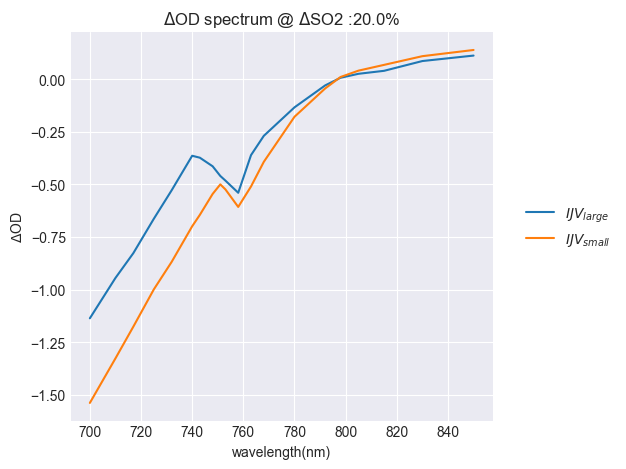

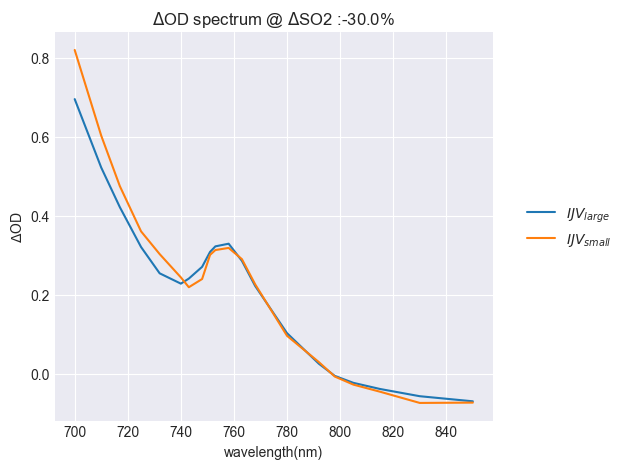

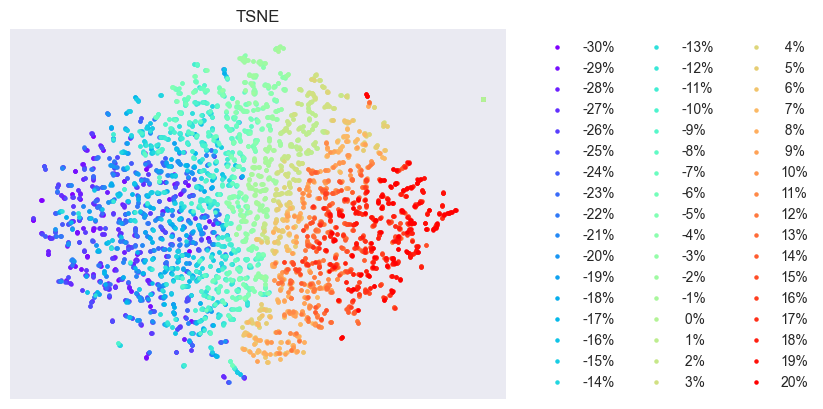

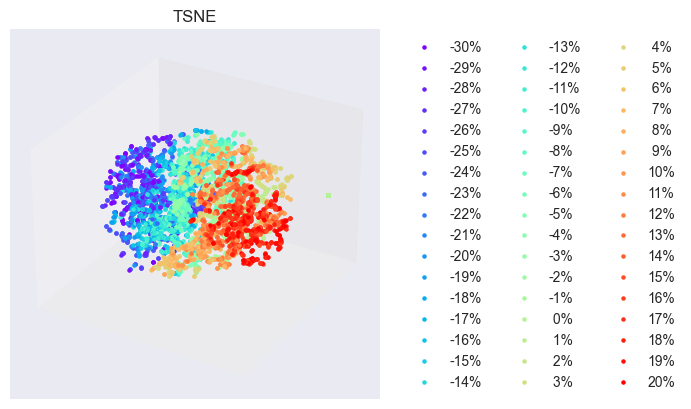

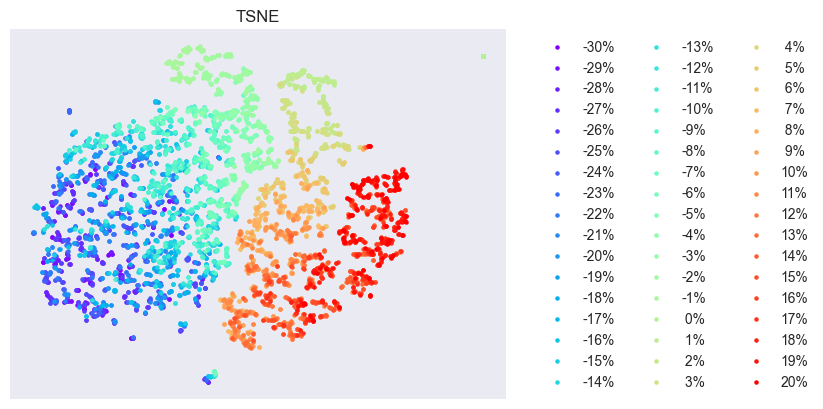

...

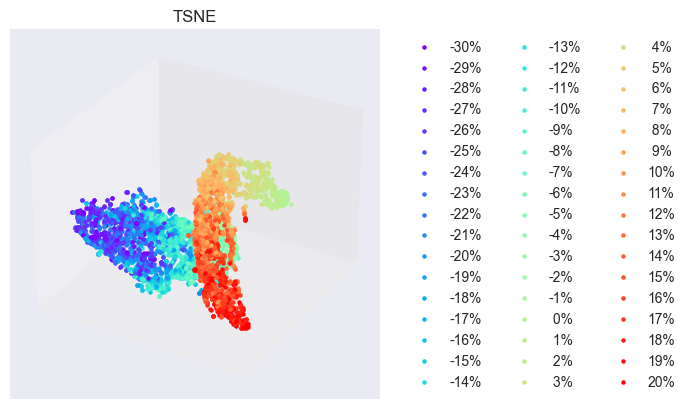

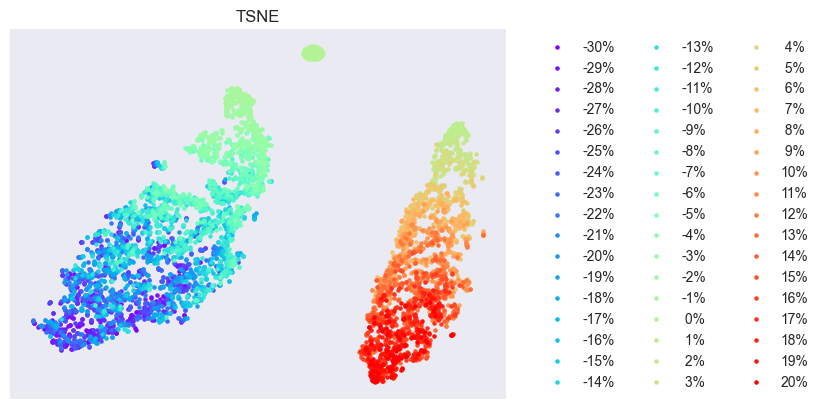

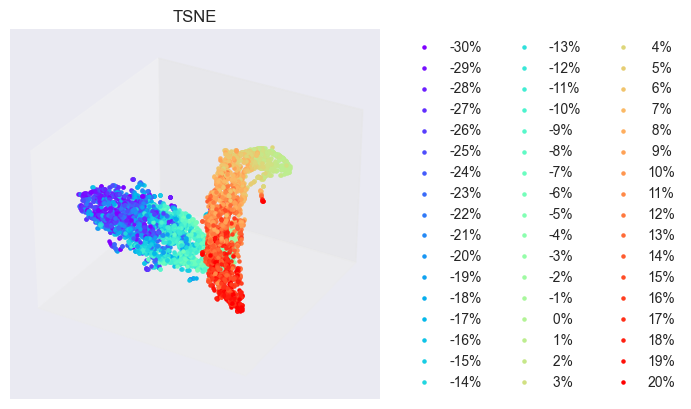

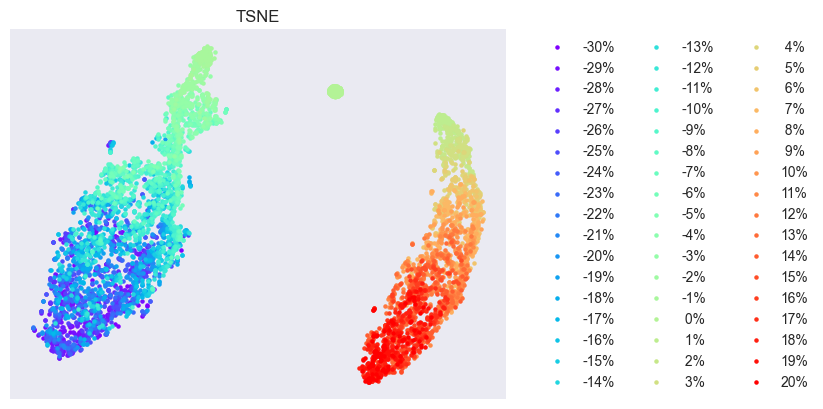

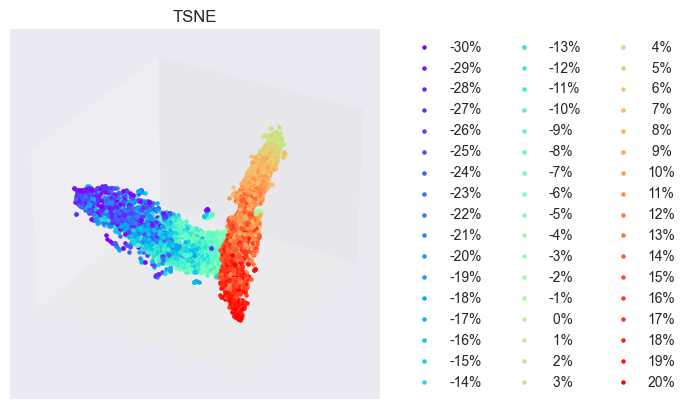

In [106]:
subject = "ctchen"
result_folder = "prediction_model_formula2"

os.makedirs(os.path.join("pic", subject, result_folder, "delta_OD"), exist_ok=True)
os.makedirs(os.path.join("pic", subject, result_folder, "tsne_2d"), exist_ok=True)
os.makedirs(os.path.join("pic", subject, result_folder, "tsne_3d"), exist_ok=True)
file_path = os.path.join("dataset", result_folder, "RMSE.csv")
dataset_formula2 = pd.read_csv(file_path)
with open(os.path.join("OPs_used", "wavelength.json"), 'r') as f:
    wavelength = json.load(f)
    wavelength = wavelength['wavelength']

plot_formula2_delta_OD(dataset=dataset_formula2, wavelength=wavelength, subject=subject, used_idx=203959, result_folder=result_folder)
plot_formula2_delta_OD(dataset=dataset_formula2, wavelength=wavelength, subject=subject, used_idx=0, result_folder=result_folder)
for perplexity in [2,5,30,50,100]:
    fig = plot_2D_tsne(dataset=dataset_formula2, num_input=40, get_portion=100, perplexity=perplexity)
    plt.savefig(os.path.join("pic", subject, result_folder, "tsne_2d", f"p_{perplexity}_tsne_2d.png"), dpi=300, format='png', bbox_inches='tight')
    plt.show(fig)
    fig = plot_3D_tsne(dataset=dataset_formula2, num_input=40, get_portion=100, perplexity=perplexity)
    plt.savefig(os.path.join("pic", subject, result_folder, "tsne_3d", f"p_{perplexity}_tsne_3d.png"), dpi=300, format='png', bbox_inches='tight')
    plt.show(fig)

In [57]:
subject = "ctchen"
result_folder = "prediction_model_formula3"

os.makedirs(os.path.join("pic", subject, result_folder, "similarity"), exist_ok=True)
file_path = os.path.join("dataset", result_folder, "RMSE.csv")
dataset_formula3 = pd.read_csv(file_path)

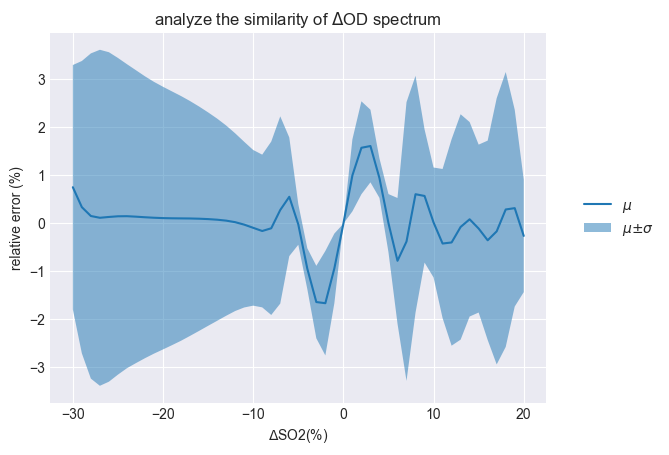

In [58]:
SO2_used = [i for i in range(-30,21)]
# get dataset and label
dataset = dataset_formula3.sort_values('true')
use_col = []
use_col = ['error']
similarity_set = dataset[use_col].to_numpy()
label = dataset['true'].to_numpy()

get_portion = 4000
similarity_data = {}
label_dict = {}
for SO2_idx in range(len(SO2_used)):
    used_index = [i for i in range(SO2_idx*4000,SO2_idx*4000+get_portion)]
    similarity_data[SO2_used[SO2_idx]] = similarity_set[used_index]
    label_dict[SO2_used[SO2_idx]] = np.round(label[used_index],2)
    # label = np.round(label[used_index],2)

accumulate_mean = []
accumulate_std = []
for using_SO2 in similarity_data.keys():
    # similarity_set = dataset_formula2[dataset_formula2['true'] == using_SO2]['similarity_0'].to_numpy()
    similarity_mean = np.mean(similarity_data[using_SO2])
    # print(f'{similarity_mean}')
    similarity_std = np.std(similarity_data[using_SO2])
    accumulate_mean += [similarity_mean]
    accumulate_std += [similarity_std]
plt.figure()
plt.plot(similarity_data.keys(), accumulate_mean, label=r'$\mu$')
plt.fill_between(similarity_data.keys(), np.array(accumulate_mean)+2*np.array(accumulate_std), np.array(accumulate_mean)-2*np.array(accumulate_std), label=r'$\mu$$\pm$$\sigma$', alpha=0.5)
plt.title("analyze the similarity of $\u0394$OD spectrum")
plt.xlabel("$\u0394$SO2(%)")
plt.ylabel("relative error (%)")
plt.legend(loc='center left', bbox_to_anchor=(1.05, 0.5),
          fancybox=True, shadow=True)
plt.savefig(os.path.join("pic", subject, result_folder, "similarity", "variability_error.png"), dpi=300, format='png', bbox_inches='tight')
plt.show()

# plot similarity

In [3]:
subject = "ctchen"
result_folder = "prediction_model_formula2"

os.makedirs(os.path.join("pic", subject, result_folder, "similarity"), exist_ok=True)
file_path = os.path.join("dataset", result_folder, "similar_analysis.csv")
dataset_formula2 = pd.read_csv(file_path)

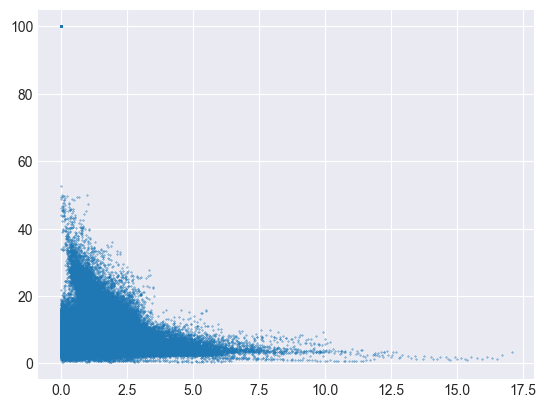

In [33]:
error = dataset_formula2['abs_error'].to_numpy()
using_col = [f'similarity_0']
similarity_mean = dataset_formula2[using_col].to_numpy()
similarity_mean = np.mean(similarity_mean, axis=1)
plt.scatter(error, similarity_mean, label=r'$\mu$', s=0.1)
plt.show()

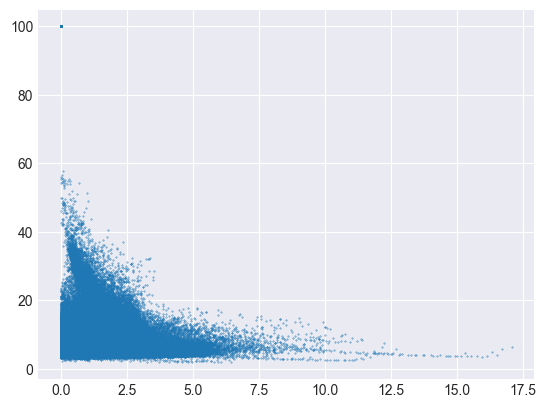

In [30]:
error = dataset_formula2['abs_error'].to_numpy()
using_col = []
for i in range(10):
    using_col += [f'similarity_{i}']
similarity_mean = dataset_formula2[using_col].to_numpy()
similarity_mean = np.mean(similarity_mean, axis=1)
plt.scatter(error, similarity_mean, label=r'$\mu$', s=0.1)
plt.show()

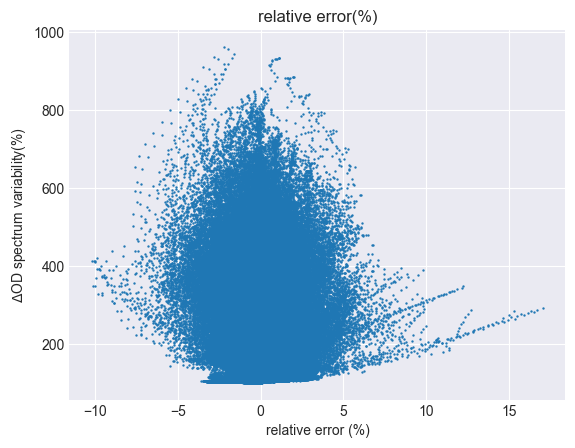

In [6]:
error = dataset_formula2['error'].to_numpy()
similarity_mean = dataset_formula2['similarity_mean'].to_numpy()
plt.scatter(error, similarity_mean, label=r'$\mu$', s=0.5)
plt.title("relative error(%)")
plt.xlabel("relative error (%)")
plt.ylabel('$\u0394$OD spectrum variability(%)')
plt.savefig(os.path.join("pic", subject, result_folder, "similarity", "variability_scatter_error.png"), dpi=300, format='png', bbox_inches='tight')
plt.show()

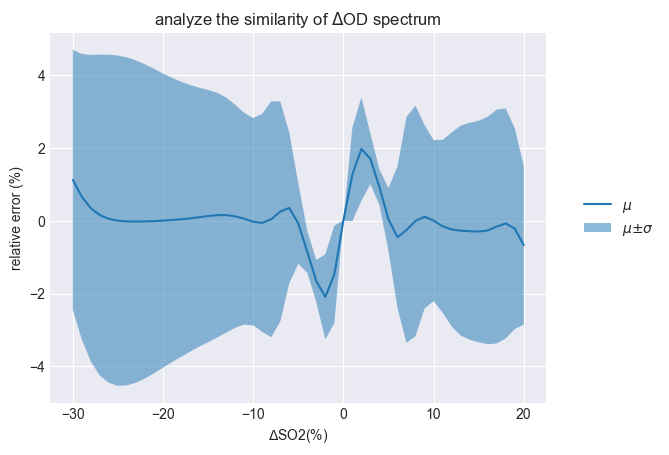

In [55]:
SO2_used = [i for i in range(-30,21)]
# get dataset and label
dataset = dataset_formula2.sort_values('true')
use_col = []
use_col = ['error']
similarity_set = dataset[use_col].to_numpy()
label = dataset['true'].to_numpy()

get_portion = 4000
similarity_data = {}
label_dict = {}
for SO2_idx in range(len(SO2_used)):
    used_index = [i for i in range(SO2_idx*4000,SO2_idx*4000+get_portion)]
    similarity_data[SO2_used[SO2_idx]] = similarity_set[used_index]
    label_dict[SO2_used[SO2_idx]] = np.round(label[used_index],2)
    # label = np.round(label[used_index],2)

accumulate_mean = []
accumulate_std = []
for using_SO2 in similarity_data.keys():
    # similarity_set = dataset_formula2[dataset_formula2['true'] == using_SO2]['similarity_0'].to_numpy()
    similarity_mean = np.mean(similarity_data[using_SO2])
    # print(f'{similarity_mean}')
    similarity_std = np.std(similarity_data[using_SO2])
    accumulate_mean += [similarity_mean]
    accumulate_std += [similarity_std]
plt.figure()
plt.plot(similarity_data.keys(), accumulate_mean, label=r'$\mu$')
plt.fill_between(similarity_data.keys(), np.array(accumulate_mean)+2*np.array(accumulate_std), np.array(accumulate_mean)-2*np.array(accumulate_std), label=r'$\mu$$\pm$$\sigma$', alpha=0.5)
plt.title("analyze the similarity of $\u0394$OD spectrum")
plt.xlabel("$\u0394$SO2(%)")
plt.ylabel("relative error (%)")
plt.legend(loc='center left', bbox_to_anchor=(1.05, 0.5),
          fancybox=True, shadow=True)
plt.savefig(os.path.join("pic", subject, result_folder, "similarity", "variability_error.png"), dpi=300, format='png', bbox_inches='tight')
plt.show()

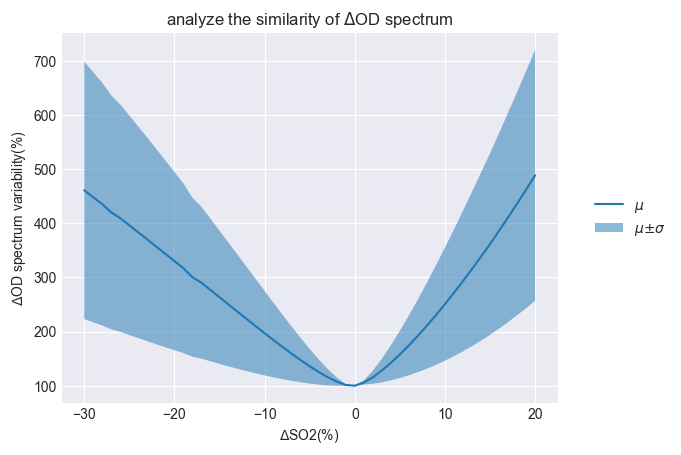

In [41]:
SO2_used = [i for i in range(-30,21)]
# get dataset and label
dataset = dataset_formula2.sort_values('true')
use_col = []
use_col = ['similarity_mean']
similarity_set = dataset[use_col].to_numpy()
label = dataset['true'].to_numpy()

get_portion = 4000
similarity_data = {}
label_dict = {}
for SO2_idx in range(len(SO2_used)):
    used_index = [i for i in range(SO2_idx*4000,SO2_idx*4000+get_portion)]
    similarity_data[SO2_used[SO2_idx]] = similarity_set[used_index]
    label_dict[SO2_used[SO2_idx]] = np.round(label[used_index],2)
    # label = np.round(label[used_index],2)

accumulate_mean = []
accumulate_std = []
for using_SO2 in similarity_data.keys():
    # similarity_set = dataset_formula2[dataset_formula2['true'] == using_SO2]['similarity_0'].to_numpy()
    similarity_mean = np.mean(similarity_data[using_SO2])
    # print(f'{similarity_mean}')
    similarity_std = np.std(similarity_data[using_SO2])
    accumulate_mean += [similarity_mean]
    accumulate_std += [similarity_std]
plt.figure()
plt.plot(similarity_data.keys(), accumulate_mean, label=r'$\mu$')
plt.fill_between(similarity_data.keys(), np.array(accumulate_mean)+2*np.array(accumulate_std), np.array(accumulate_mean)-2*np.array(accumulate_std), label=r'$\mu$$\pm$$\sigma$', alpha=0.5)
plt.title("analyze the similarity of $\u0394$OD spectrum")
plt.xlabel("$\u0394$SO2(%)")
plt.ylabel("$\u0394$OD spectrum variability(%)")
plt.legend(loc='center left', bbox_to_anchor=(1.05, 0.5),
          fancybox=True, shadow=True)
plt.savefig(os.path.join("pic", subject, result_folder, "similarity", "variability.png"), dpi=300, format='png', bbox_inches='tight')
plt.show()